# Unsupervsied Machine Learning Final Project

## By Chase Bugajski, University of Colorado - Boulder

## Introduction

For this assignment, I was tasked with finding and analyzing a dataset using unsupervised machine learning methods we learned in class. I decided instead of finding a premade dataset that I would analyze a dataset that I mined myself. My dataset is composed of information about condos in Washington, D.C. Please see the 'DC Open Data' notebook in the same Github folder as this notebook for more information about where the data comes from. The goal of this notebook is to compare supervised and unsupervised clustering techniques on condo wards.

I'm breaking this up into three parts: data preparation and exploratory data analysis (EDA), model creation and testing, and conclusions.

## Part 1: Data Preparation & EDA

In [1]:
import pandas as pd
#You may have to uncomment the below line if the seaborn plots fail
#%pip install seaborn==0.11.0
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.metrics import accuracy_score, confusion_matrix
import time

First, I'm reading in the dataset.

In [2]:
condos = pd.read_csv('condos.csv')
condos.head()

,SSL_condo,Actual_Year_Built,Effective_Year_Built,ROOMS,BEDRM,BATHRM,HF_BATHRM,HEAT,AC,FIREPLACES,Living_SqFt,WARD,ZIPCODE,LATITUDE,LONGITUDE,QUADRANT,RES_TYPE,APPRAISED_VALUE_CURRENT_TOTAL
0,0025 2295,2006,2006,4,1,2,0,8.0,1.0,0,1161,Ward 2,20037.0,38.904239,-77.052353,NW,RESIDENTIAL,919910.0
1,0025 2296,2006,2006,4,2,2,0,8.0,1.0,0,1047,Ward 2,20037.0,38.904239,-77.052353,NW,RESIDENTIAL,847580.0
2,0025 2297,2006,2006,4,2,2,0,8.0,1.0,0,1291,Ward 2,20037.0,38.904239,-77.052353,NW,RESIDENTIAL,970460.0
3,0025 2298,2006,2006,4,1,1,0,8.0,1.0,0,805,Ward 2,20037.0,38.904239,-77.052353,NW,RESIDENTIAL,678120.0
4,0025 2300,2006,2006,3,1,1,0,8.0,1.0,0,750,Ward 2,20037.0,38.904239,-77.052353,NW,RESIDENTIAL,601160.0


In [3]:
condos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40889 entries, 0 to 40888
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   SSL_condo                      40889 non-null  object 
 1   Actual_Year_Built              40889 non-null  int64  
 2   Effective_Year_Built           40889 non-null  int64  
 3   ROOMS                          40889 non-null  int64  
 4   BEDRM                          40889 non-null  int64  
 5   BATHRM                         40889 non-null  int64  
 6   HF_BATHRM                      40889 non-null  int64  
 7   HEAT                           40889 non-null  float64
 8   AC                             40872 non-null  float64
 9   FIREPLACES                     40889 non-null  int64  
 10  Living_SqFt                    40889 non-null  int64  
 11  WARD                           40889 non-null  object 
 12  ZIPCODE                        40889 non-null 

I cleaned most of the data in the other notebook, including outlier detection and removal and taking care of null values. AC has a couple null values which I'll remove later. As a summary of cleaning procedures in the other notebook, here is what I did to get to this final dataset:   
- Downloaded and merged 4 public datasets from opendata.dc.gov
- Used boxplots to determine outliers for ordinal variables (e.g., number of bedroms) and IQR to determine outliers to condo price
- The final dataset includes units with the following characteristics: up to 6 rooms, up to 3 bedrooms, up to 3 bathrooms, up to 1 half bath, up to 1 fireplace, and up to $1,049,351.25

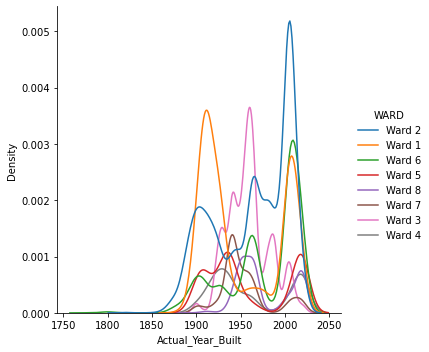

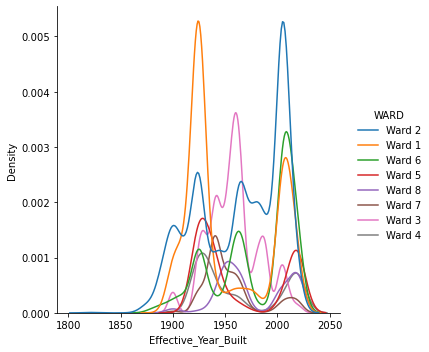

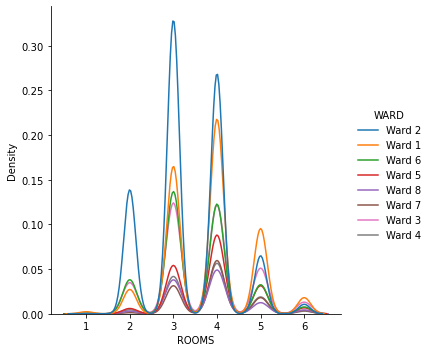

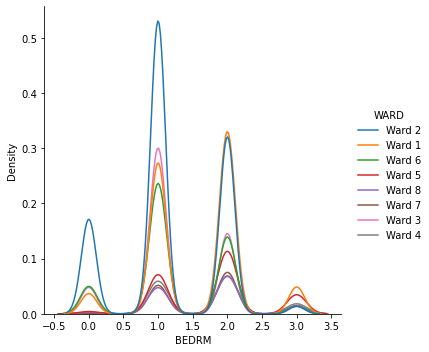

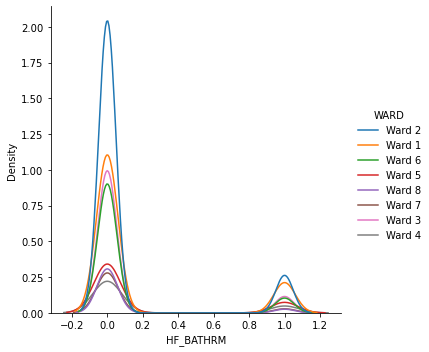

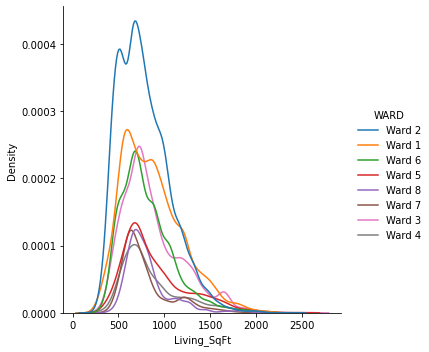

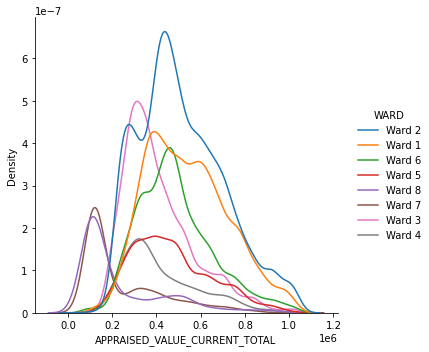

In [4]:
columns = ["Actual_Year_Built","Effective_Year_Built","ROOMS","BEDRM","HF_BATHRM","Living_SqFt", 'APPRAISED_VALUE_CURRENT_TOTAL']

for column in columns:
    print(sns.displot(data = condos, x = str(column), hue="WARD", kind="kde"))
    

This data is a mess and, since many of the variables are ordinal and small, e.g., number of of rooms, it's difficult to see if any of those variables will be useful. Actual and effective year built and appraised value seem to have the most diversity between wards so far.

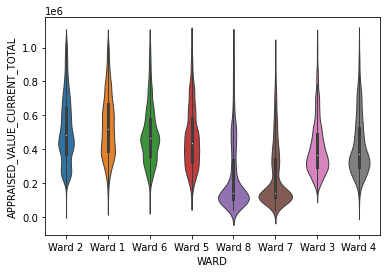

In [5]:
ax=sns.violinplot(x="WARD", y="APPRAISED_VALUE_CURRENT_TOTAL", data=condos, linewidth=1)
plt.show()

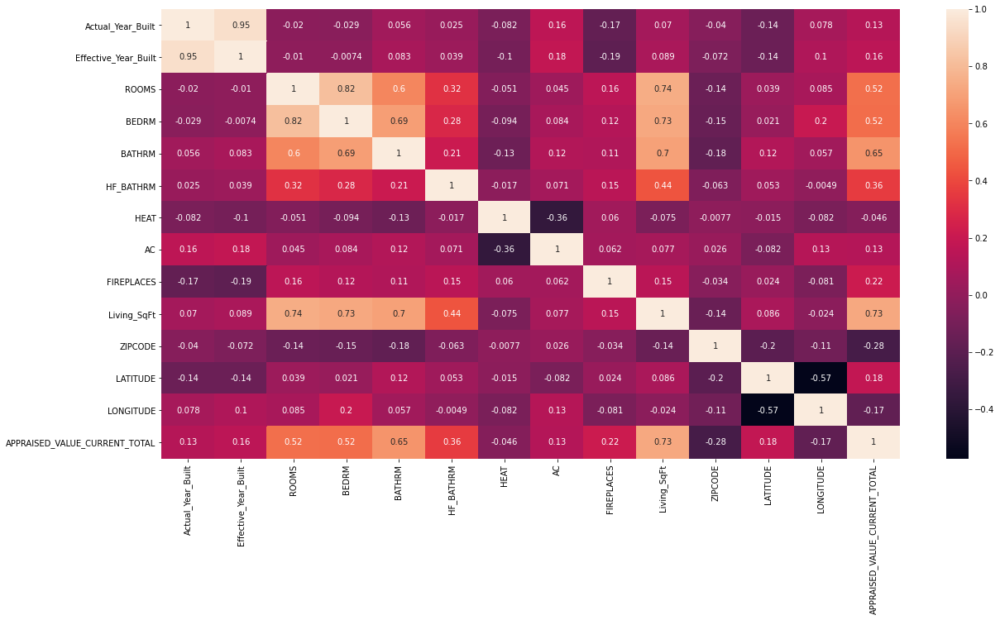

In [6]:
plt.subplots(figsize=(20,10))
sns.heatmap(condos.corr(), annot = True)

Here we see some high correlations between many sets of variables, such as Rooms and Living_Sqft, which is to be expected given that the number of rooms directly impacts amount of square feet.

In [7]:
condos['WARD'].value_counts()

Ward 2    11563
Ward 1     8186
Ward 3     6064
Ward 6     5585
Ward 5     3233
Ward 4     2258
Ward 7     2004
Ward 8     1996
Name: WARD, dtype: int64

In [8]:
upsamp = max(condos['WARD'].value_counts())
classes = condos['WARD'].unique()[1:]

condo_upsamp = condos.loc[(condos['WARD'] == 'Ward 2')]
condo_downsamp = condos.loc[(condos['WARD'] == 'Ward 2')].sample(500)

for clas in classes:
    upsamped = condos.loc[(condos['WARD'] == clas)].sample(upsamp, replace=True)
    condo_upsamp = pd.concat([condo_upsamp,upsamped])
    downsamp = condos.loc[(condos['WARD'] == clas)].sample(500)
    condo_downsamp = pd.concat([condo_downsamp,downsamp])

condo_upsamp['WARD'].value_counts()


Ward 2    11563
Ward 7    11563
Ward 3    11563
Ward 6    11563
Ward 1    11563
Ward 5    11563
Ward 8    11563
Ward 4    11563
Name: WARD, dtype: int64

One final note on wards: I don't anticipate having high clustering accuracy. Wards are a political determination which splits the DC population into roughly equal populations, i.e., the population of each ward is about the same. Some wards have higher population density than others: if you live in the heart of the downtown area, your population density is high, as is your rent (condo prices tend to be higher in Wards 1 and 2 which are in the center of the city; explore the rest of my Github if you want more details!). As such, we saw above that Ward 2 has the highest population pre-bootstrapping; this is because there are more condos than other types of housing in this ward in this sample, e.g., houses or townhouses. Since wards are political geographical determinations, they don't have much utility in terms of clustering, however I'll be interested to see how the unsupervised clusters change from the existing wards. Here is what our wards currently look like.

## Part 2: Modeling

First, I'll try supervised KNN and then compare the supervised to the unsupervised K Means clustering from class. I will specify 8 clusters for each since we have 8 wards for comparison. Again, I don't anticipate the wards to hold up in the unsupervised model.

In [10]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay, accuracy_score


In [11]:
catfeat= ["QUADRANT", "ZIPCODE", 'RES_TYPE', "HEAT"]

encoded_df = pd.get_dummies(data = condo_upsamp, columns = catfeat)
encoded_df.dropna(inplace=True)
x_data = encoded_df.drop(['SSL_condo','WARD'], axis = 1)
y_data = encoded_df['WARD']
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size = 0.20, random_state=679)
x_data.head()


,Actual_Year_Built,Effective_Year_Built,ROOMS,BEDRM,BATHRM,HF_BATHRM,AC,FIREPLACES,Living_SqFt,LATITUDE,...,HEAT_4.0,HEAT_5.0,HEAT_6.0,HEAT_7.0,HEAT_8.0,HEAT_9.0,HEAT_10.0,HEAT_11.0,HEAT_12.0,HEAT_13.0
0,2006,2006,4,1,2,0,1.0,0,1161,38.904239,...,0,0,0,0,1,0,0,0,0,0
1,2006,2006,4,2,2,0,1.0,0,1047,38.904239,...,0,0,0,0,1,0,0,0,0,0
2,2006,2006,4,2,2,0,1.0,0,1291,38.904239,...,0,0,0,0,1,0,0,0,0,0
3,2006,2006,4,1,1,0,1.0,0,805,38.904239,...,0,0,0,0,1,0,0,0,0,0
4,2006,2006,3,1,1,0,1.0,0,750,38.904239,...,0,0,0,0,1,0,0,0,0,0


In [12]:
KNN = KNeighborsClassifier()

param_to_try = {"n_neighbors" : [i for i in range(1, 5)]}
grid = GridSearchCV(estimator = KNN, param_grid = param_to_try)
grid.fit(x_train, y_train)
means = list(grid.cv_results_['mean_test_score'])
print('Best KNN: ', grid.best_params_ , 'Accuracy: ', grid.best_score_)


Best KNN:  {'n_neighbors': 1} Accuracy:  0.884384498390685


No handles with labels found to put in legend.


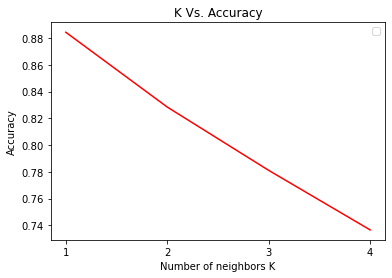

In [13]:
knns = list(range(1, 5))

plt.plot(knns, means, 'red')
plt.locator_params(axis="x", integer=True, tight=True)
plt.xlabel("Number of neighbors K")
plt.ylabel("Accuracy")
plt.title("K Vs. Accuracy")
plt.legend()
plt.show()

In [14]:
def confusion(y_true, yhat):
    cm = confusion_matrix(y_true = y_true, y_pred = yhat)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels = classes)
    fig, ax = plt.subplots(figsize=(10,10))
    disp.plot(ax=ax, values_format='')
    size = len(x_train)


None
0.9110029737766964
              precision    recall  f1-score   support

      Ward 1       0.79      0.82      0.81      2252
      Ward 2       0.83      0.66      0.73      2309
      Ward 3       0.93      0.94      0.93      2293
      Ward 4       0.95      0.99      0.97      2340
      Ward 5       0.92      0.97      0.94      2357
      Ward 6       0.88      0.92      0.90      2282
      Ward 7       0.98      1.00      0.99      2335
      Ward 8       0.99      1.00      0.99      2327

    accuracy                           0.91     18495
   macro avg       0.91      0.91      0.91     18495
weighted avg       0.91      0.91      0.91     18495



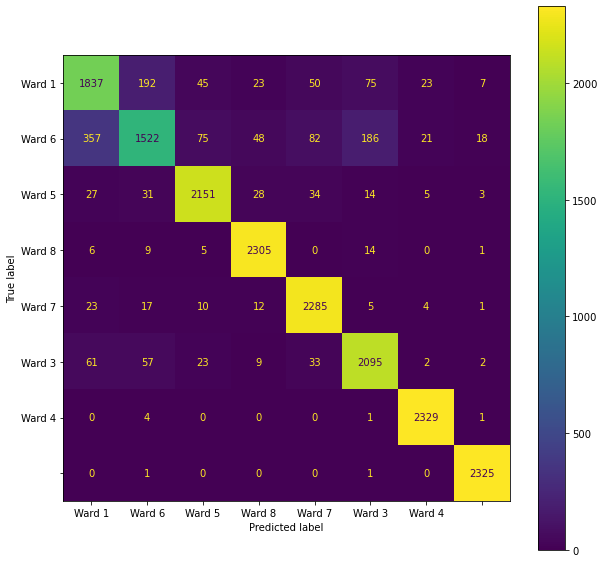

In [15]:
KNN = KNeighborsClassifier(n_neighbors = 1)
KNN_fit = KNN.fit(x_train, y_train)
yhat = KNN_fit.predict(x_test)

print(confusion(y_test, yhat))
print(accuracy_score(y_true = y_test, y_pred = yhat))
print(classification_report(y_true = y_test, y_pred = yhat))

In [16]:
x_test['y_actual'] = y_test
x_test['y_pred'] = yhat

<ipython-input-16-5f5a04b8faac>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_test['y_actual'] = y_test
<ipython-input-16-5f5a04b8faac>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_test['y_pred'] = yhat


In [17]:
sample_df = x_test.sample(5000)

alt.Chart(sample_df, title='Washington, D.C. condos, actual wards').mark_circle().encode(
    x = alt.X('LONGITUDE:Q',  scale=alt.Scale(domain=[sample_df['LONGITUDE'].min(), sample_df['LONGITUDE'].max()])),
    y = alt.Y("LATITUDE:Q", scale=alt.Scale(domain=[sample_df['LATITUDE'].min(), sample_df['LATITUDE'].max()])),
    color=alt.Color('y_actual', scale=alt.Scale(scheme='dark2')),
).properties(
    width=600,
    height=600
).interactive()

alt.Chart(...)

In [18]:
sample_df = x_test.sample(5000)

alt.Chart(sample_df, title='Washington, D.C. condos, predicted wards').mark_circle().encode(
    x = alt.X('LONGITUDE:Q',  scale=alt.Scale(domain=[sample_df['LONGITUDE'].min(), sample_df['LONGITUDE'].max()])),
    y = alt.Y("LATITUDE:Q", scale=alt.Scale(domain=[sample_df['LATITUDE'].min(), sample_df['LATITUDE'].max()])),
    color=alt.Color('y_pred', scale=alt.Scale(scheme='dark2')),
).properties(
    width=600,
    height=600
).interactive()

alt.Chart(...)

The supervised model did well at classifying ward! This isn't surprising since, by definition, the model had training data with the label. Let's see if unsupervised is any good.

In [19]:
from sklearn.cluster import KMeans
import itertools
from sklearn.metrics import accuracy_score

def label_permute_compare(ytdf,yp,n=8):
    """
    ytdf: labels dataframe object
    yp: clustering label prediction output
    Returns permuted label order and accuracy. 
    Example output: (3, 4, 1, 2, 0), 0.74 
    """
    np_labels = ytdf.to_numpy(copy = True)
    
    #Arrange true label names by frequency
    temp1 = np.unique(np_labels, return_counts = True)
    (true_labs, true_counts) = (temp1[0], temp1[1])
    true_index = true_counts.argsort()
    true_sort = true_labs[true_index[::-1]]
    
    #Arrange cluster assignment names by frequency
    temp2 = np.unique(yp, return_counts = True)
    (pred_labs, pred_counts) = (temp2[0], temp2[1])
    pred_index = pred_counts.argsort()
    pred_sort = pred_labs[pred_index[::-1]]
    
    #Stick them together in a dictionary
    comparison_dic = dict()
    k = true_sort.shape[0]
    for i in range(k):
        comparison_dic.update({true_sort[i] : pred_sort[i]})
    
    # Standardize np_labels by replacing the string entries with characters in accordance to comparison_dic
    newLabs = list()
    for lab in np_labels:
        this_val = comparison_dic[lab]
        newLabs.append(this_val)
    newLabs = np.asarray(newLabs)
    
    # Compute accuracy of model.
    this_accuracy = accuracy_score(y_true = newLabs, y_pred = yp)
    
    return (comparison_dic, this_accuracy)


In [20]:
def best_kmeans(x_data, y_data):
    alg_to_try = ["elkan", "auto"]
    init_to_try = ["random", "k-means++"]
    current_best_acc = 0

    for alg in alg_to_try:
        for init in init_to_try:
            this_kmeans = KMeans(n_clusters = 8, random_state = 42, init = init, algorithm = alg)
            this_kmeans.fit(x_data)
            this_accuracy = label_permute_compare(y_data, this_kmeans.labels_,n=8)[1]
            print("The model with algorithm \"", alg, "\" and centroid initialization \"", init, "\" yielded an accuracy of ", this_accuracy)

            if this_accuracy > current_best_acc:
                current_best_acc = this_accuracy
                current_best_alg = alg
                current_best_init = init
                current_best_model = this_kmeans

    print("The best kmeans Clustering Model had algorithm \"", current_best_alg, "\"and centroid initialization \"", init)
    return (current_best_alg, init)

(alg, init) = best_kmeans(x_data, y_data)


The model with algorithm " elkan " and centroid initialization " random " yielded an accuracy of  0.09974803456143956
The model with algorithm " elkan " and centroid initialization " k-means++ " yielded an accuracy of  0.09925059206471078
The model with algorithm " auto " and centroid initialization " random " yielded an accuracy of  0.09974803456143956
The model with algorithm " auto " and centroid initialization " k-means++ " yielded an accuracy of  0.09925059206471078
The best kmeans Clustering Model had algorithm " elkan "and centroid initialization " k-means++


None
0.09925059206471078
              precision    recall  f1-score   support

      Ward 1       0.25      0.08      0.12     11532
      Ward 2       0.19      0.12      0.15     11563
      Ward 3       0.08      0.07      0.08     11563
      Ward 4       0.20      0.19      0.20     11563
      Ward 5       0.15      0.18      0.16     11563
      Ward 6       0.01      0.01      0.01     11563
      Ward 7       0.06      0.09      0.07     11563
      Ward 8       0.04      0.06      0.05     11563

    accuracy                           0.10     92473
   macro avg       0.12      0.10      0.10     92473
weighted avg       0.12      0.10      0.10     92473



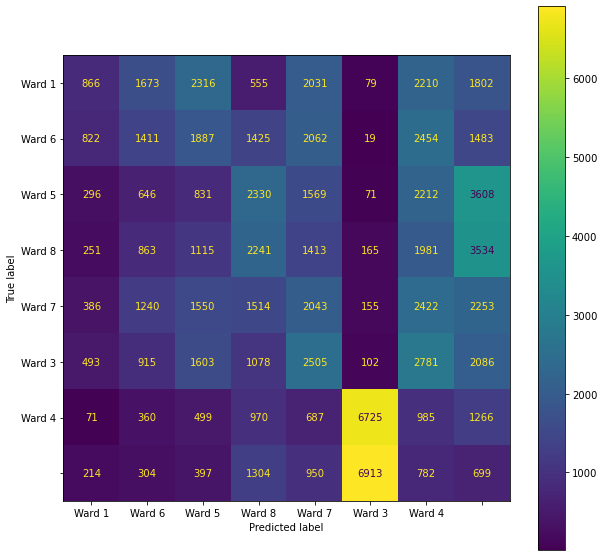

In [21]:
kmean = KMeans(n_clusters = 8, random_state = 42, init = init, algorithm = alg)
kmean_fit = kmean.fit(x_data)
yhat = kmean_fit.labels_

x_data['y_actual'] = y_data
x_data['y_pred'] = yhat

yhat_ultimate = yhat

dic = label_permute_compare(y_data, yhat, n=8)[0]

new_dict = {}
for k,v in list(dic.items()):
    new_dict[v]=k

x_data = x_data.replace({"y_pred": new_dict}) 

print(confusion(x_data['y_actual'], x_data['y_pred']))
print(accuracy_score(y_true = x_data['y_actual'], y_pred = x_data['y_pred']))
print(classification_report(y_true = x_data['y_actual'], y_pred = x_data['y_pred']))


In [23]:
alt.Chart(sample_df, title='Washington, D.C. condos, by cluster').mark_circle().encode(
    x = alt.X('LONGITUDE:Q',  scale=alt.Scale(domain=[sample_df['LONGITUDE'].min(), sample_df['LONGITUDE'].max()])),
    y = alt.Y("LATITUDE:Q", scale=alt.Scale(domain=[sample_df['LATITUDE'].min(), sample_df['LATITUDE'].max()])),
    color=alt.Color('y_pred', scale=alt.Scale(scheme='dark2')),
).properties(
    width=600,
    height=600
).interactive()

alt.Chart(...)

The unsupervised cluster was a horrible failure. Many of the variables don't appear to distinguish between ward at all. What if I only kept variables that didn't need to be encoded, would that help at all? Or maybe just the variable related to geographic space?

In [24]:
condo_quant = condo_upsamp[['Actual_Year_Built','Effective_Year_Built','ROOMS','BEDRM','BATHRM','HF_BATHRM',
                            'FIREPLACES','Living_SqFt','ZIPCODE','LATITUDE','LONGITUDE',
                            'APPRAISED_VALUE_CURRENT_TOTAL','WARD']]
condo_locat = condo_upsamp[['LATITUDE','LONGITUDE','ZIPCODE','WARD']]

In [25]:
#condo_upsamp.dropna(inplace=True)
x_data = condo_quant.drop(['WARD'], axis = 1)
y_data = condo_quant['WARD']


The model with algorithm " elkan " and centroid initialization " random " yielded an accuracy of  0.09953083109919571
The model with algorithm " elkan " and centroid initialization " k-means++ " yielded an accuracy of  0.10003891723601141
The model with algorithm " auto " and centroid initialization " random " yielded an accuracy of  0.09953083109919571
The model with algorithm " auto " and centroid initialization " k-means++ " yielded an accuracy of  0.10003891723601141
The best kmeans Clustering Model had algorithm " elkan "and centroid initialization " k-means++
None
0.10003891723601141
              precision    recall  f1-score   support

      Ward 1       0.25      0.08      0.12     11563
      Ward 2       0.19      0.13      0.15     11563
      Ward 3       0.08      0.07      0.08     11563
      Ward 4       0.20      0.19      0.19     11563
      Ward 5       0.15      0.18      0.17     11563
      Ward 6       0.01      0.01      0.01     11563
      Ward 7       0.06 

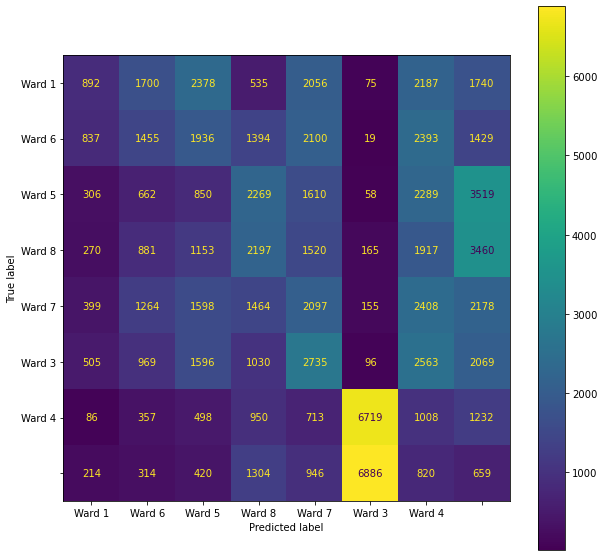

In [26]:
(alg, init) = best_kmeans(x_data, y_data)
kmean = KMeans(n_clusters = 8, random_state = 42, init = init, algorithm = alg)
kmean_fit = kmean.fit(x_data)
yhat = kmean_fit.labels_

x_data['y_actual'] = y_data
x_data['y_pred'] = yhat

dic = label_permute_compare(y_data, yhat, n=8)[0]

new_dict = {}
for k,v in list(dic.items()):
    new_dict[v]=k

x_data = x_data.replace({"y_pred": new_dict}) 

print(confusion(x_data['y_actual'], x_data['y_pred']))
print(accuracy_score(y_true = x_data['y_actual'], y_pred = x_data['y_pred']))
print(classification_report(y_true = x_data['y_actual'], y_pred = x_data['y_pred']))

In [27]:
x_data = condo_locat.drop(['WARD'], axis = 1)
y_data = condo_locat['WARD']

The model with algorithm " elkan " and centroid initialization " random " yielded an accuracy of  0.13947504972757935
The model with algorithm " elkan " and centroid initialization " k-means++ " yielded an accuracy of  0.03385799532993168
The model with algorithm " auto " and centroid initialization " random " yielded an accuracy of  0.13947504972757935
The model with algorithm " auto " and centroid initialization " k-means++ " yielded an accuracy of  0.03385799532993168
The best kmeans Clustering Model had algorithm " elkan "and centroid initialization " k-means++
None
0.13947504972757935
              precision    recall  f1-score   support

      Ward 1       0.00      0.00      0.00     11563
      Ward 2       0.00      0.00      0.00     11563
      Ward 3       0.45      0.23      0.30     11563
      Ward 4       0.00      0.00      0.00     11563
      Ward 5       0.00      0.00      0.00     11563
      Ward 6       0.00      0.00      0.00     11563
      Ward 7       0.49 

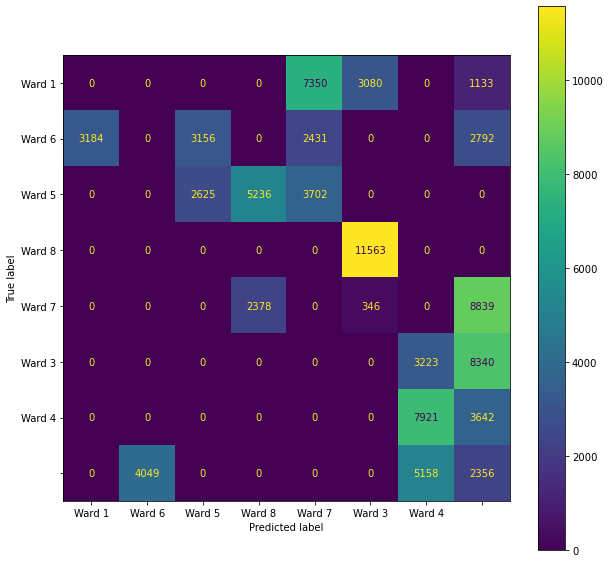

In [28]:
(alg, init) = best_kmeans(x_data, y_data)
kmean = KMeans(n_clusters = 8, random_state = 42, init = "random", algorithm = "auto")
kmean_fit = kmean.fit(x_data)
yhat = kmean_fit.labels_

x_data['y_actual'] = y_data
x_data['y_pred'] = yhat

dic = label_permute_compare(y_data, yhat, n=8)[0]

new_dict = {}
for k,v in list(dic.items()):
    new_dict[v]=k

x_data = x_data.replace({"y_pred": new_dict}) 

print(confusion(x_data['y_actual'], x_data['y_pred']))
print(accuracy_score(y_true = x_data['y_actual'], y_pred = x_data['y_pred']))
print(classification_report(y_true = x_data['y_actual'], y_pred = x_data['y_pred']))

I think cluster analysis won't work for ward. 

## Conclusion

As I predicted earlier, unsupervised cluster analysis does not at all predict ward. Supervised clustering models did, but unsupervised found its own pattern in the data. Looking at the final map, the patterns found by the algorithm do not seem to relate to geography at all. Also, looking at the breakdown of clusters below, the algorithm didn't spit out equal clusters, as was initially fed into it. I tried removing some variables which I thought were confounding it, however neither of my methods worked. Future research should try to figure out what the clusters were; this information can potentially help with price prediction, one of my other main goals for this overal Github project.